In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
df=pd.read_excel('aspiring_minds_employability_outcomes_2015.xlsx')
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [3]:
df.shape

(3998, 39)

In [4]:
df.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,...,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,...,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,...,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


# Salary

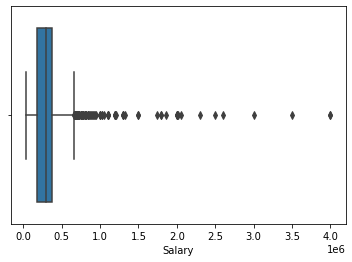

In [5]:
sns.boxplot(x=df['Salary'])

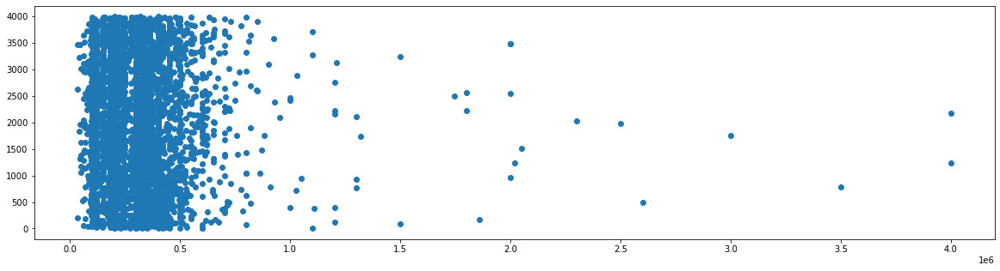

In [6]:
fig, ax = plt.subplots(figsize=(20,5))
ax.scatter(df['Salary'], range(len(df['Salary'])))

Here we are ovserving that almost most peple salary is under 100000.

In [7]:
salcheck = df.apply(lambda x: True if x['Salary'] <= 1000000  else False , axis=1)
numrows = len(salcheck[salcheck == True].index)
numrows

3962

In [8]:
salcheck = df.apply(lambda x: True if x['Salary'] <= 1500000  else False , axis=1)
numrows = len(salcheck[salcheck == True].index)
numrows

3981

Here we can remove the salary greaater than 10 lakh. we will consider it as outlier.

In [9]:
df.drop(df[ df['Salary'] > 1000000 ].index , inplace=True)
df.shape

(3962, 39)

salary outliers gets removed

# Gender

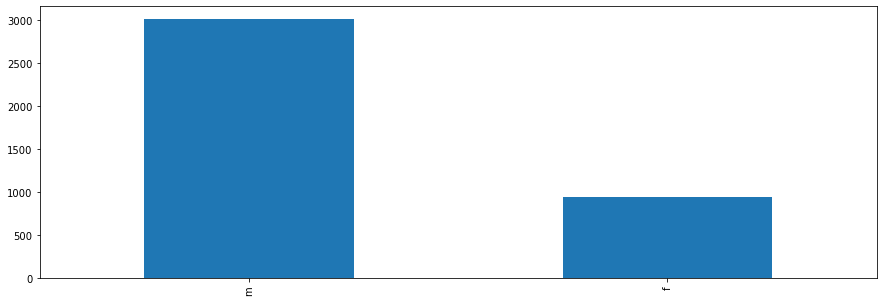

In [10]:
df['Gender'].value_counts().plot(kind='bar', figsize=(15,5))

- There is more male data than female data

In [11]:
mensalary = df.loc[:,:].loc[df['Gender']=='m']['Salary']
femsalary = df.loc[:,:].loc[df['Gender']=='f']['Salary']

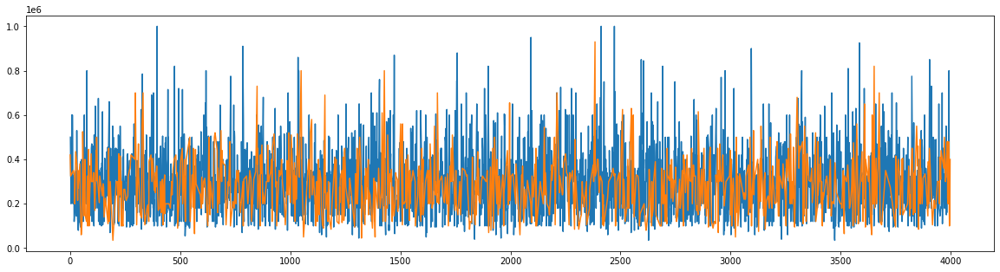

In [12]:
plt.figure(figsize=(20,5))
plt.plot(mensalary)
plt.plot(femsalary)


In [13]:
mensalary.mean()

297484.72775564407

In [14]:
femsalary.mean()

284252.63157894736

<BarContainer object of 2 artists>

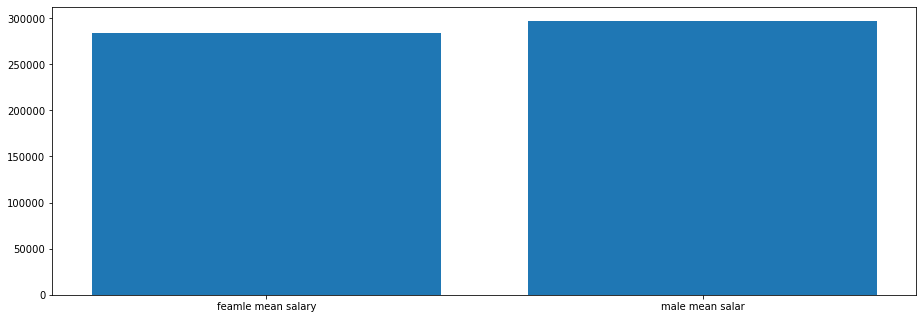

In [15]:
fig = plt.figure()
ax = fig.add_axes([0,0,2,1])
ax.bar(['feamle mean salary','male mean salar'],[femsalary.mean(),mensalary.mean()],)

Male mean salary is little bit higher than female 

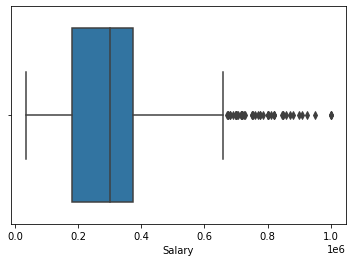

In [16]:
sns.boxplot(x=mensalary)

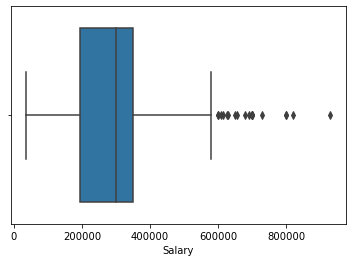

In [17]:
sns.boxplot(x=femsalary)

In [21]:
meanmediandf = pd.DataFrame({
    'male':[mensalary.mean(),mensalary.median()],'female':[femsalary.mean(),femsalary.median()]
}, index=['mean', 'median'])

meanmediandf

,male,female
mean,297484.727756,284252.631579
median,300000.000000,300000.000000


Here we can clearly see median of male and female salary is same but mean salary of male is little bit high.Almost we are proving gender equality here.hahahaaa

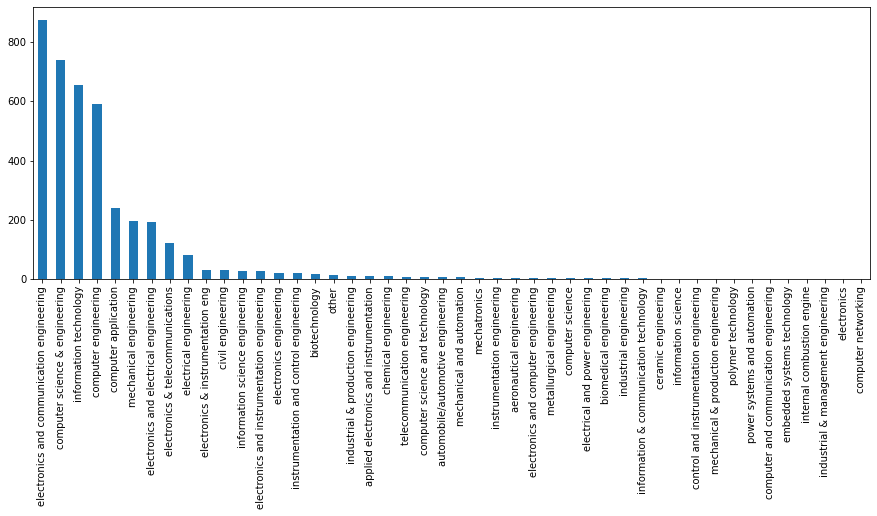

In [22]:
spe_freq = df['Specialization'].value_counts()
spe_freq.plot(kind='bar', figsize=(15,5))

In [25]:
specialization_map ={'electronics and communication engineering' : 'EC',
 'computer science & engineering' : 'CS',
 'information technology' : 'CS' ,
 'computer engineering' : 'CS',
 'computer application' : 'CS',
 'mechanical engineering' : 'ME',
 'electronics and electrical engineering' : 'EC',
 'electronics & telecommunications' : 'EC',
 'electrical engineering' : 'EL',
 'electronics & instrumentation eng' : 'EC',
 'civil engineering' : 'CE',
 'electronics and instrumentation engineering' : 'EC',
 'information science engineering' : 'CS',
 'instrumentation and control engineering' : 'EC',
 'electronics engineering' : 'EC',
 'biotechnology' : 'other',
 'other' : 'other',
 'industrial & production engineering' : 'other',
 'chemical engineering' : 'other',
 'applied electronics and instrumentation' : 'EC',
 'computer science and technology' : 'CS',
 'telecommunication engineering' : 'EC',
 'mechanical and automation' : 'ME',
 'automobile/automotive engineering' : 'ME',
 'instrumentation engineering' : 'EC',
 'mechatronics' : 'ME',
 'electronics and computer engineering' : 'CS',
 'aeronautical engineering' : 'ME',
 'computer science' : 'CS',
 'metallurgical engineering' : 'other',
 'biomedical engineering' : 'other',
 'industrial engineering' : 'other',
 'information & communication technology' : 'EC',
 'electrical and power engineering' : 'EL',
 'industrial & management engineering' : 'other',
 'computer networking' : 'CS',
 'embedded systems technology' : 'EC',
 'power systems and automation' : 'EL',
 'computer and communication engineering' : 'CS',
 'information science' : 'CS',
 'internal combustion engine' : 'ME',
 'ceramic engineering' : 'other',
 'mechanical & production engineering' : 'ME',
 'control and instrumentation engineering' : 'EC',
 'polymer technology' : 'other',
 'electronics' : 'EC'}

['CS' 'EC' 'ME' 'EL' 'CE' 'other']


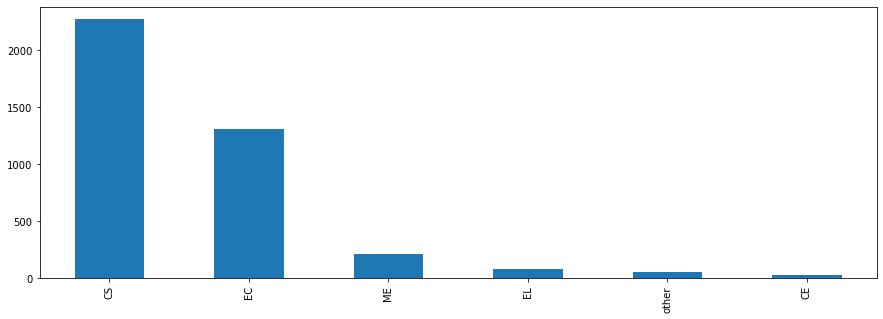

In [26]:
df['Specialization'] = df['Specialization'].map(specialization_map)

df['Specialization'].value_counts().plot(kind='bar', figsize=(15,5))

print(df['Specialization'].unique())

# TIMES OF INDIA RESEARCH QUESTION

Times of India article dated Jan 18, 2019 states that “After doing your Computer Science
Engineering if you take up jobs as a Programming Analyst, Software Engineer,
Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh
graduate.” Test this claim with the data given to you.
- Is there a relationship between gender and specialisation? (i.e. Does the preference of
Specialisation depend on the Gender?)

### AVERAGE SALARY OF CS FRESH GRADUATE

In [38]:
df.loc[:,:].loc[df['Specialization']=='CS']['Salary'].mean()

297323.6331569665

Yes the claim of TOI is right the average or mean package of CS graduate is between 2.5 - 3 lakh that is 297323.63 (almost 3 lakh)

## RELATIONSHIP BETWEEN GENDER AND SPECIAIIZATION

Text(0.5, 1.0, 'total male student specialization')

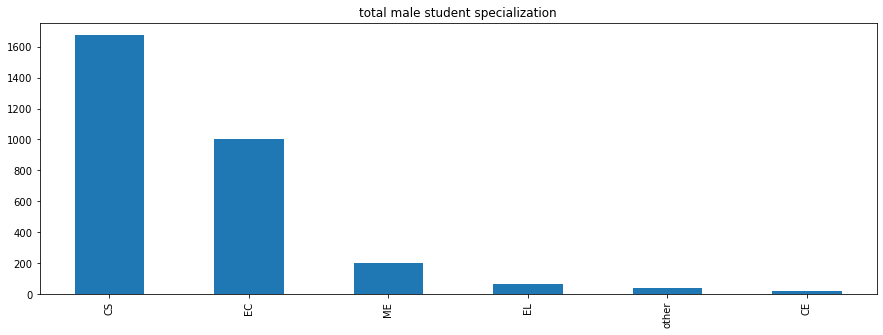

In [51]:
df.loc[:,:].loc[df['Gender']=='m']['Specialization'].value_counts().plot(kind='bar', figsize=(15,5))
plt.title('total male student specialization')

Text(0.5, 1.0, 'total female student specialization')

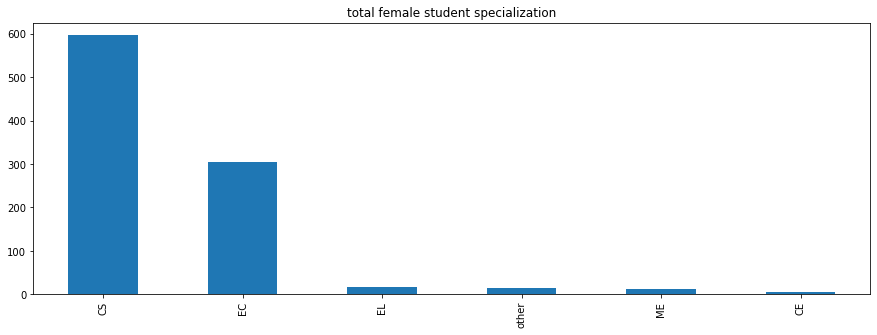

In [52]:
df.loc[:,:].loc[df['Gender']=='f']['Specialization'].value_counts().plot(kind='bar', figsize=(15,5))
plt.title('total female student specialization')

### RATIO OF MALE FEMALE DATA

In [47]:
len(df.loc[:,:].loc[df['Gender']=='m'])/len(df.loc[:,:].loc[df['Gender']=='f'])

3.170526315789474

As there is 3 times more male data than female data so we have to check the ratio of no of student in all the specialization.

In [59]:
(df.loc[:,:].loc[df['Gender']=='m']['Specialization'].value_counts()/df.loc[:,:].loc[df['Gender']=='f']['Specialization'].value_counts())

CE        3.833333
CS        2.805369
EC        3.291803
EL        4.250000
ME       17.000000
other     2.733333
Name: Specialization, dtype: float64

These are the ratio of no. of male student by no of female student in particular organisation.This should be ideally equalto 3.17 for the equal proportion of student per specialization

Text(0.5, 1.0, 'Ratio of male/ femele students in per specialization')

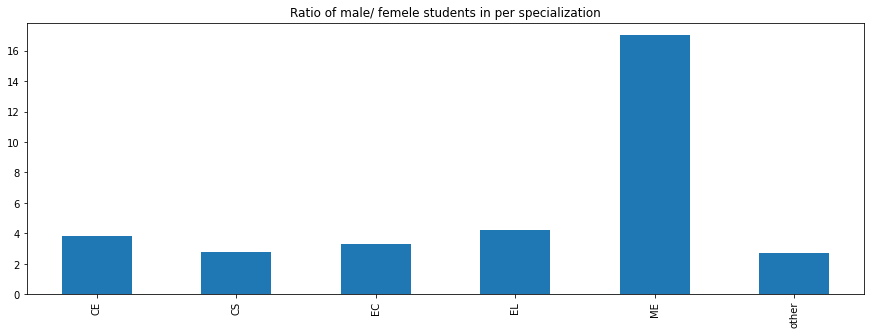

In [63]:
(df.loc[:,:].loc[df['Gender']=='m']['Specialization'].value_counts()/df.loc[:,:].loc[df['Gender']=='f']['Specialization'].value_counts()).plot(kind='bar', figsize=(15,5))
plt.title("Ratio of male/ femele students in per specialization")



In [65]:
pd.DataFrame(df.loc[:,:].loc[df['Gender']=='m']['Specialization'].value_counts()/df.loc[:,:].loc[df['Gender']=='f']['Specialization'].value_counts())

,Specialization
CE,3.833333
CS,2.805369
EC,3.291803
EL,4.250000
ME,17.000000
other,2.733333


####  Does the preference of Specialisation depend on the Gender?

Here we are observing that in mechanical engineering ratio is to much high it should be equal to 3.1 but here is 17 means **male prefer mechanical branch more than female**. and we are also ovserving thal cs ratio is low than 3.1 means **female prefer computer science branch more than male**

In [66]:

df['DOB']=pd.to_datetime(df['DOB'])
df['Dyear']=df['DOB'].dt.year
df.drop(columns=['DOB'],axis=1,inplace=True)

df['12graduation']=pd.to_datetime(df['12graduation'])
df['12gyear']=df['12graduation'].dt.year
df.drop(columns=['12graduation'],axis=1,inplace=True)

df['GraduationYear']=pd.to_datetime(df['GraduationYear'])
df['gyear']=df['GraduationYear'].dt.year
df.drop(columns=['GraduationYear'],axis=1,inplace=True)

df['12GradAge']=abs(df['12gyear']-df['Dyear'])
df['GradAge']=abs(df['gyear']-df['Dyear'])

Here we just change dates to that year and just added age of candidate.

In [67]:
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,10percentage,10board,...,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Dyear,12gyear,gyear,12GradAge,GradAge
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,84.30,"board ofsecondary education,ap",...,0.9737,0.8128,0.5269,1.35490,-0.4455,1990,1970,1970,20,20
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,85.40,cbse,...,-0.7335,0.3789,1.2396,-0.10760,0.8637,1989,1970,1970,19,19
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,85.00,cbse,...,0.2718,1.7109,0.1637,-0.86820,0.6721,1992,1970,1970,22,22
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,78.00,cbse,...,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,1991,1970,1970,21,21
5,train,1027655,300000,2014-06-01,present,system engineer,Hyderabad,m,89.92,state board,...,-0.3027,-0.6201,-2.2954,-0.74150,-0.8608,1992,1970,1970,22,22


c:\python\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
c:\python\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
c:\python\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
c:\python\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


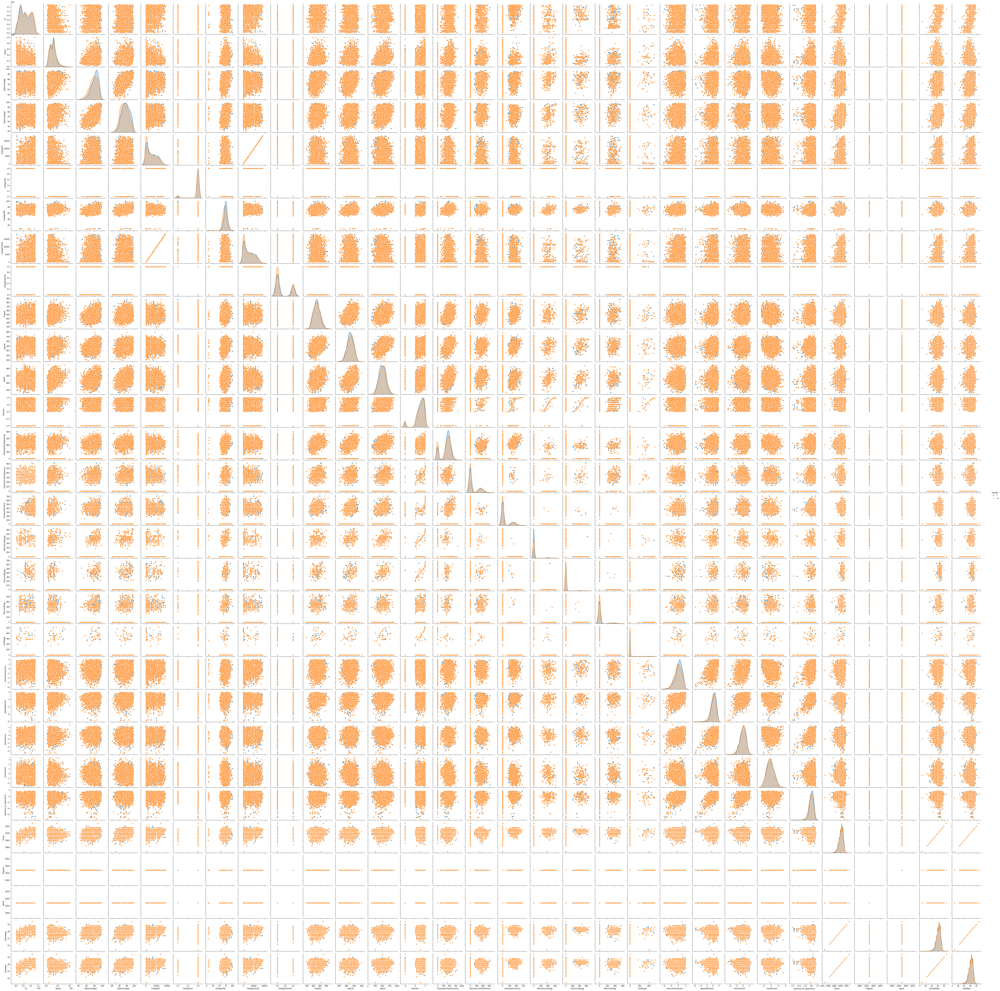

In [70]:
sns.pairplot(df , hue = 'Gender')

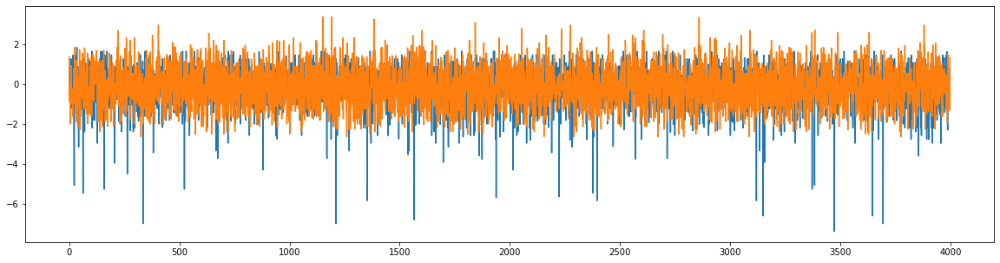

In [71]:
plt.figure(figsize=(20,5))
plt.plot(df["openess_to_experience"])
plt.plot(df['nueroticism'])
